In [14]:
import pandas as pd
import numpy as np
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('headlines_with_coordinates.csv')

In [3]:
df.head(10)

,headline,cities,latitude,longitude,countrycode
0,Zika Outbreak Hits Miami,Miami,25.77427,-80.19366,US
1,Could Zika Reach New York City?,New York City,40.71427,-74.00597,US
2,First Case of Zika in Miami Beach,Miami Beach,25.79065,-80.13005,US
3,"Mystery Virus Spreads in Recife, Brazil",Recife,-8.05389,-34.88111,BR
4,Dallas man comes down with case of Zika,Dallas,32.78306,-96.80667,US
5,Trinidad confirms first Zika case,Trinidad,-14.83333,-64.90000,BO
6,Zika Concerns are Spreading in Houston,Houston,29.76328,-95.36327,US
7,Geneve Scientists Battle to Find Cure,Geneve,46.20222,6.14569,CH
8,The CDC in Atlanta is Growing Worried,Atlanta,33.74900,-84.38798,US
9,Zika Infested Monkeys in Sao Paulo,Sao Paulo,-23.54750,-46.63611,BR


First random try with KMeans

In [4]:
from sklearn.cluster import KMeans

In [9]:
def number_of_clusters_kmeans(k):
    kmeans = KMeans(n_clusters=k, random_state=42)
    y_pred = kmeans.fit_predict(df[['latitude','longitude']])
    df['cluster'] = y_pred

In [10]:
number_of_clusters_kmeans(20)

In [11]:
df.head()

,headline,cities,latitude,longitude,countrycode,cluster
0,Zika Outbreak Hits Miami,Miami,25.77427,-80.19366,US,12
1,Could Zika Reach New York City?,New York City,40.71427,-74.00597,US,14
2,First Case of Zika in Miami Beach,Miami Beach,25.79065,-80.13005,US,12
3,"Mystery Virus Spreads in Recife, Brazil",Recife,-8.05389,-34.88111,BR,6
4,Dallas man comes down with case of Zika,Dallas,32.78306,-96.80667,US,4


In [15]:
def plot_map(df):
    map_plotter = Basemap()
    fig = plt.figure(figsize=(60,20))
    map_plotter.shadedrelief()
    map_plotter.drawcountries()
    colors = plt.cm.rainbow(np.linspace(0,1,len(df.cluster.unique())))
    for i, col in enumerate(colors):
        map_plotter.scatter(df[df.cluster==i]['longitude'],df[df.cluster==i]['latitude'], latlon=True , c=np.array([col]), label='Cluster: {}'.format(i))
    plt.legend(loc='lower right')# handles = df.cluster.values, labels=df.cluster.values)
    return plt.show()

def plot_map(df):
    map_plotter = Basemap()
    fig = plt.figure(figsize=(60,20))
    map_plotter.shadedrelief()
    map_plotter.drawcountries()
    map_plotter.scatter(df['longitude'],df['latitude'], latlon=True , c=df['cluster'], cmap='hsv', label=df['cluster'].unique())
    #plt.legend(loc='lower right')# handles = df.cluster.values, labels=df.cluster.values)
    return plt.show()

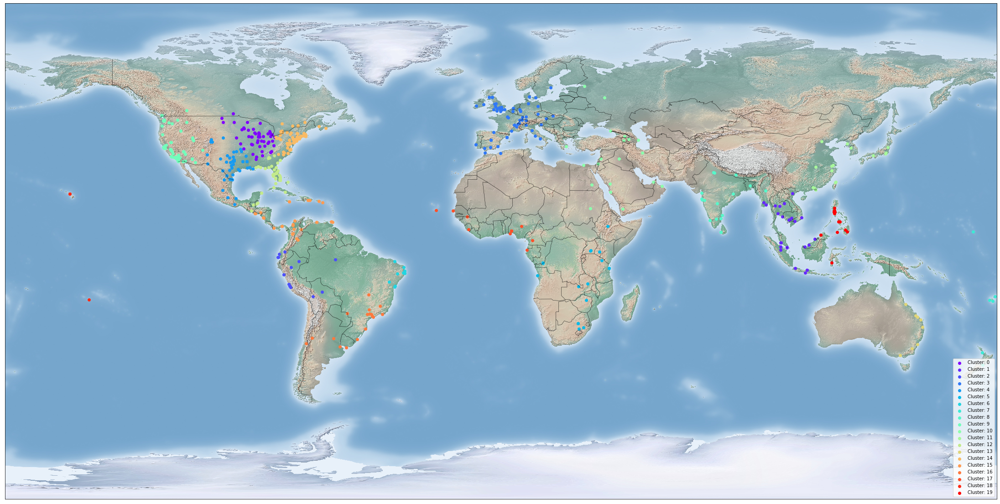

In [16]:
plot_map(df)

Elbow method to identify the optimal number of clusters:

In [17]:
inertia = []
range_ = range(1,15)

for i in range_:
    kmeans = KMeans(n_clusters=i, n_init=15)
    kmeans.fit(df[['latitude','longitude']])
    inertia.append(kmeans.inertia_)

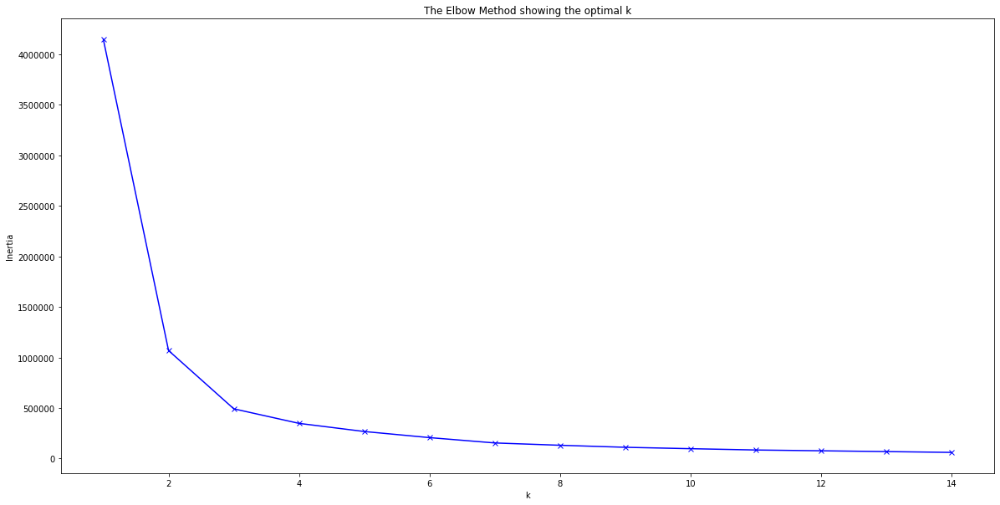

In [19]:
plt.figure(figsize=(20, 10))
plt.plot(range_, inertia, 'bx-')
plt.xlabel('k')
plt.ylabel('Inertia')
plt.title('The Elbow Method showing the optimal k')
plt.show()

In [20]:
number_of_clusters_kmeans(6)

In [21]:
df.head()

,headline,cities,latitude,longitude,countrycode,cluster
0,Zika Outbreak Hits Miami,Miami,25.77427,-80.19366,US,2
1,Could Zika Reach New York City?,New York City,40.71427,-74.00597,US,2
2,First Case of Zika in Miami Beach,Miami Beach,25.79065,-80.13005,US,2
3,"Mystery Virus Spreads in Recife, Brazil",Recife,-8.05389,-34.88111,BR,4
4,Dallas man comes down with case of Zika,Dallas,32.78306,-96.80667,US,2


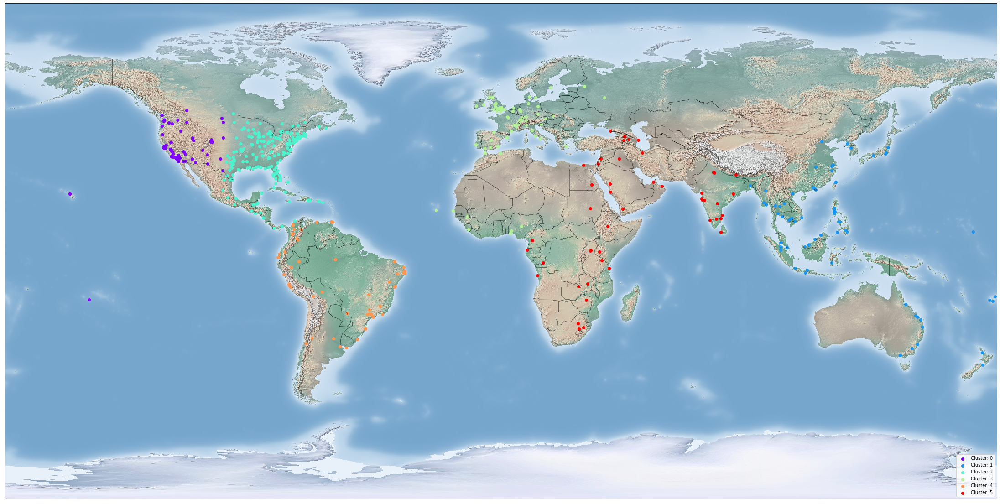

In [22]:
plot_map(df)

rozproszone dane, 

The Elbow method isn’t perfect, but it will perform reasonably well if the data is clearly centered on K distinct means. This of course, assumes that our data-clusters differ due to centrality. not good with ellipsoidal clusters :(

DBSCAN

In [23]:
from sklearn.cluster import DBSCAN

In [24]:
def clusters_dbscan(eps, samples, metric='euclidean'):
    dbscan = DBSCAN(eps=eps, min_samples=samples)
    dbscan.fit(df[['latitude','longitude']])
    df['cluster'] = list(dbscan.labels_)

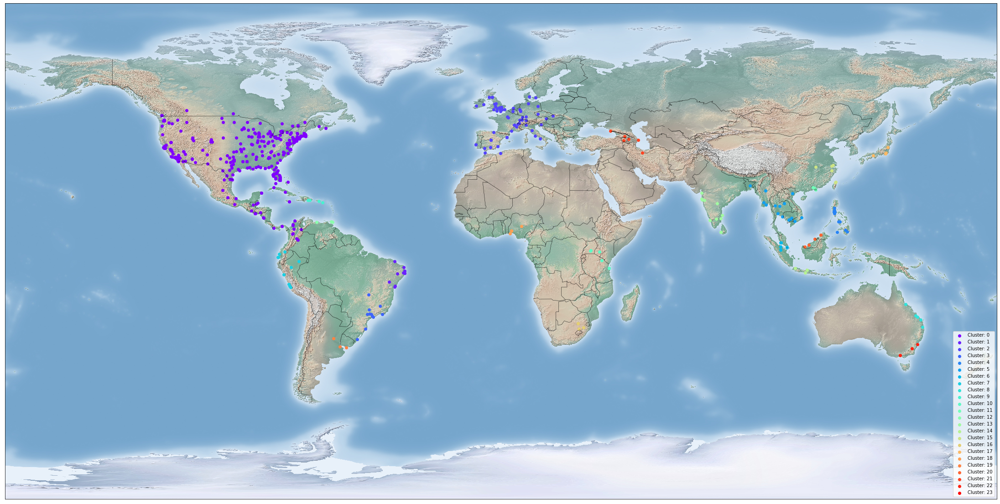

In [25]:
clusters_dbscan(6, 4)
plot_map(df)

In [26]:
from math import radians, degrees, sin, cos, asin, acos, sqrt
def great_circle_distance(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    return 6371 * (
        acos(sin(lat1) * sin(lat2) + cos(lat1) * cos(lat2) * cos(lon1 - lon2))) 

In [27]:
clusters_dbscan(6,4,great_circle_distance)

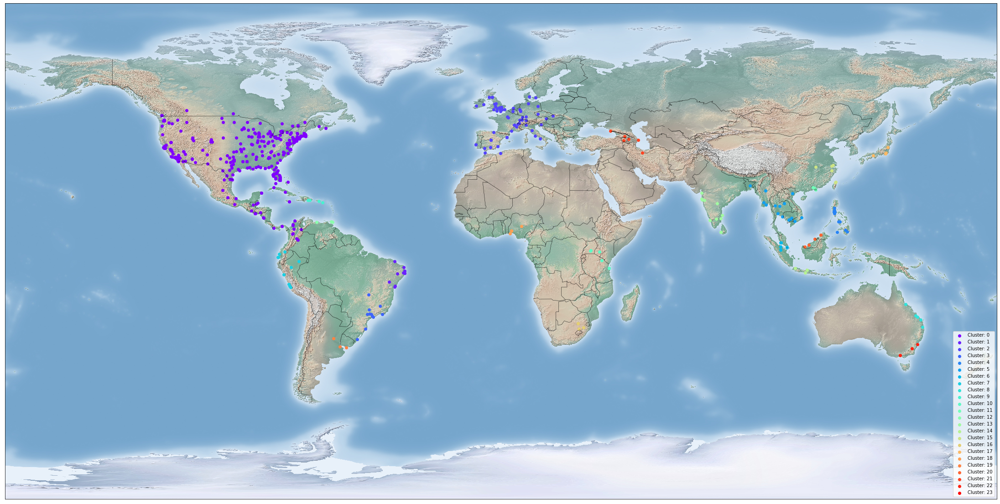

In [28]:
plot_map(df)